# Vacant Lots as Sites for Insurgent Strategies

##   Group: LandAccess4All
Lupe Rentreria Salome and Mel Liu

### What vacant lots are potentially available and usable by community members in Los Angeles?

In 222A Histories and Theories of Planning, we learned about how research is often used to answer questions we already know the answers to. What both of us don't know is what are the possibilities for taking land back admidst housing shortages and privitization, as well as goverment misuse of public lands. 

We are interested in exploring this toward envisioning how land could exist outside colonial frameworks in urban enviroments. Urban planning in cities such as Los Angeles has resulted from contestation of spaces and visions. Despite this history of contenstation, how might communities and entities be able collaborate toward healing? 

We wanted to consider vacant lots as a potential starting point. In recent history, public plazas, streets, and many other public spaces have been occupied and/or made autonomous temporarily. There are also attempts to take back land through reclaiming homes and corridors that were violented taken from displaced community members through agencies like CalTrans.

"[Reclaiming Our Community](https://www.dignidad.org/apps/pages/index.jsp?uREC_ID=1751066&type=d&pREC_ID=1931939) is a proposal for a locally controlled, community-centered and Indigenous Peoples-led vision to regenerate a healthy socio-ecosystem in what is now the Caltrans Corridor section of Los Angeles. Health, housing and habitat restoration in the Corridor involve reinvesting in the community by restoring hundreds of houses, vacant properties and blighted lots (over 10 acres) which currently scar the neighborhoods in El Sereno from Elephant Hill to the University Hills. From the Doctrine of Discovery to the department of transportation, the impacts on these lands of colonization by settler societies have never been acknowledged, addressed or adequately considered in the long-term visions of the City of Los Angeles."

In the Bay Area, Sogorea Te’ Land Trust is rematriating land, often parcels that now have community gardens on them, to support cultural revilatlization preservation, food sovereignty, and other care-centered and reparative practices in response to the colonial violence that has taken place.

Los Angeles does provide some public access to vacant lots, and we hope that in making more focused maps of vacant land parcels available to community members, this information can benefit those who are building people power through land trusts and seeking rematriation efforts.

## Where This Work Starts: Our Data Sources

### [Vacant Parcels from the County Assessor](https://data.lacounty.gov/Parcel-/Vacant-Parcels-LA-County-from-ASR-Use-Code/vcaw-zeg9)

The downloadable version of this data is close to 75 mb and described as "Valuation and property description for parcels on the Assessor's annual secured assessment roll for 2015." The website says this data has been updated yearly, and we will be calling in the data using Socrata API in the hopes that we will get the recent data that was last updated on August 2, 2021.

### [Community Boundaries](https://data.lacounty.gov/GIS-Data/Community-Boundaries-CSA-/g4rb-en2z)

While "communities are one of the most complex geographic issues in the County of Los Angeles, due to historical narratives, perceptions of value, intense public interest, and shifts over time." Los Angeles has establish these community boundaries from "a need to establish a consistent geographic reporting base that will enable statistics and information to reported to the Board, that attempts to represent all of the interactions but is primarily focused on reporting." Our purposes in using this data is not for reporting, but for aggregating areas that are recognizable through their neighbrohood names using these shape files.

### [LA Zoning](https://data.lacity.org/A-Well-Run-City/LA-Zoning/8625-f7mv)

"Zoning is a tool used by the City of Los Angeles to designate, regulate and restrict the location and use of buildings, structures and land, for agriculture, residence, commerce, trade, industry or other purposes; to regulate and limit the height, number of stories, and size of buildings and other structures hereafter erected or altered to regulate and determine the size of yards and other open spaces and to regulate and limit the density of population; and for said purposes to divide the City into zones of such number, shape and area as may be deemed best suited to carry out these regulations and provide for their enforcement." We will be using this data to overlay it with vacant lots by community neighborhood in order to see what restrictions and barriers could come up related to local regulation of vacant parcels.

### 
https://trustsouthla.org/wp-content/uploads/2021/02/Increasing-Community-Power-Thru-CLTs-REPORT-TCE-BHC-Dec2020.pdf

In 2019,  Governor Newsom ordered the California Department of  General Services (DGS) and HCD to identify and prioritize excess state-owned property and pursue sustainable,  innovative,  cost-effective housing projects. The state has published a searchable and interactive GIS map of  44,000 excess properties that are potentially suitable for housing. 36  And by  April 1,  2021,  every California city and county is required to have a central inventory of  surplus and excess land and must report each parcel to HCD for inclusion in a statewide inventory.

https://cadgs.maps.arcgis.com/apps/webappviewer/index.html?id=392e5e687e9041bb8f20e3acc5b211c7

visit La county's website and you'll see that there is currently no surplus land listed as of March 1, 2022

https://dpw.lacounty.gov/mpm/surplus/

In [1]:
# to get started, we will import these libraries
import urllib.request, json 
import pandas as pd
import geopandas as gpd
import contextily as ctx
import matplotlib.pyplot as plt
from sodapy import Socrata

/opt/conda/lib/python3.9/site-packages/geopandas/_compat.py:106: UserWarning: The Shapely GEOS version (3.9.1-CAPI-1.14.2) is incompatible with the GEOS version PyGEOS was compiled with (3.10.1-CAPI-1.16.0). Conversions between both will be slow.
  warnings.warn(


In [2]:
# next we will connect to the data portal to load in vacant parcel data from LA County Assessor
client = Socrata("data.lacounty.gov", None)

# The website says this dataset has 176K rows, we are going to try to call in all of them using 180K in case more have been added. However, we are also going to limit our data to Los Angeles incorporated
results = client.get("vcaw-zeg9", limit=180000, where="taxratearea_city=='LOS ANGELES'")

# We'll need to convert to pandas DataFrame
vacdf = pd.DataFrame.from_records(results)

vacdf.sample(5)

,usecodedescchar1,roll_homeownersexemp,situsunit,recordingdate,effectiveyearbuilt,istaxableparcel,roll_totlandimp,roll_perspropexemp,parcelboundarydescription,roll_landbaseyear,...,location_1,bathrooms,sqftmain,situsdirection,roll_realestateexemp,center_lat,situszip,yearbuilt,propertylocation,situszip5
26298,Institutional,0,,19880303,0,N,0,0,FOR DESC SEE ASSESSOR'S MAPS POR OF LOT 4 IN S...,1975,...,"{'latitude': '34.1392568', 'needs_recoding': F...",0,0,,0,34.13925680,,0,NaN,NaN
8348,Residential,0,,19980930,0,Y,52977,0,TR=50508 EX ST LOT 7,1999,...,"{'latitude': '34.28996308', 'needs_recoding': ...",0,0,,0,34.28996308,,0,NaN,NaN
9907,Miscellaneous,0,,20060908,0,N,0,0,TR=14159 LOT 116,1977,...,"{'latitude': '33.94728751', 'needs_recoding': ...",0,0,W,0,33.94728751,90045-5719,0,5447 W 99TH ST LOS ANGELES CA 90045,90045
22663,Residential,0,,20031006,0,Y,31936,0,TRACT NO 9449 LOT 98,2004,...,"{'latitude': '34.11891047', 'needs_recoding': ...",0,0,,0,34.11891047,,0,NaN,NaN
24552,Residential,0,,20110915,0,Y,313530,0,TRACT # 8500 LOT 102,2012,...,"{'latitude': '34.10018912', 'needs_recoding': ...",0,0,N,0,34.10018912,90069-1403,0,1635 N KINGS RD LOS ANGELES CA 90069,90069


In [3]:
# first data exploration is to see the overall shape and types of what we called in
vacdf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33091 entries, 0 to 33090
Data columns (total 51 columns):
 #   Column                     Non-Null Count  Dtype 
---  ------                     --------------  ----- 
 0   usecodedescchar1           33080 non-null  object
 1   roll_homeownersexemp       33091 non-null  object
 2   situsunit                  33091 non-null  object
 3   recordingdate              33091 non-null  object
 4   effectiveyearbuilt         33091 non-null  object
 5   istaxableparcel            33091 non-null  object
 6   roll_totlandimp            33091 non-null  object
 7   roll_perspropexemp         33091 non-null  object
 8   parcelboundarydescription  33091 non-null  object
 9   roll_landbaseyear          33091 non-null  object
 10  situscity                  33091 non-null  object
 11  roll_impbaseyear           33091 non-null  object
 12  usetype                    33080 non-null  object
 13  cluster                    33091 non-null  object
 14  adminr

In [4]:
# we need to replace null objects with "n/a"
vacdf['usecodedescchar1'].fillna('N/A')

0         Industrial
1        Residential
2        Residential
3        Residential
4        Residential
            ...     
33086    Residential
33087    Residential
33088    Residential
33089     Commercial
33090    Residential
Name: usecodedescchar1, Length: 33091, dtype: object

In [5]:
# looks like we have 33091 vacant parcels in LA incorporated, we will need to convert our df to gdf for vacant parcels
# since data is in lat/lon's we will assign the crs to WGS84 (epsg:4326)
vacgdf = gpd.GeoDataFrame(vacdf, 
                       crs='epsg:4326',
                       geometry=gpd.points_from_xy(vacdf.center_lon, vacdf.center_lat))

In [6]:
# what is the data's projection now?
vacgdf.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

### Mapping the Vacant Lots Data 

We will add a basemap to our LA incorporated vacant lots data

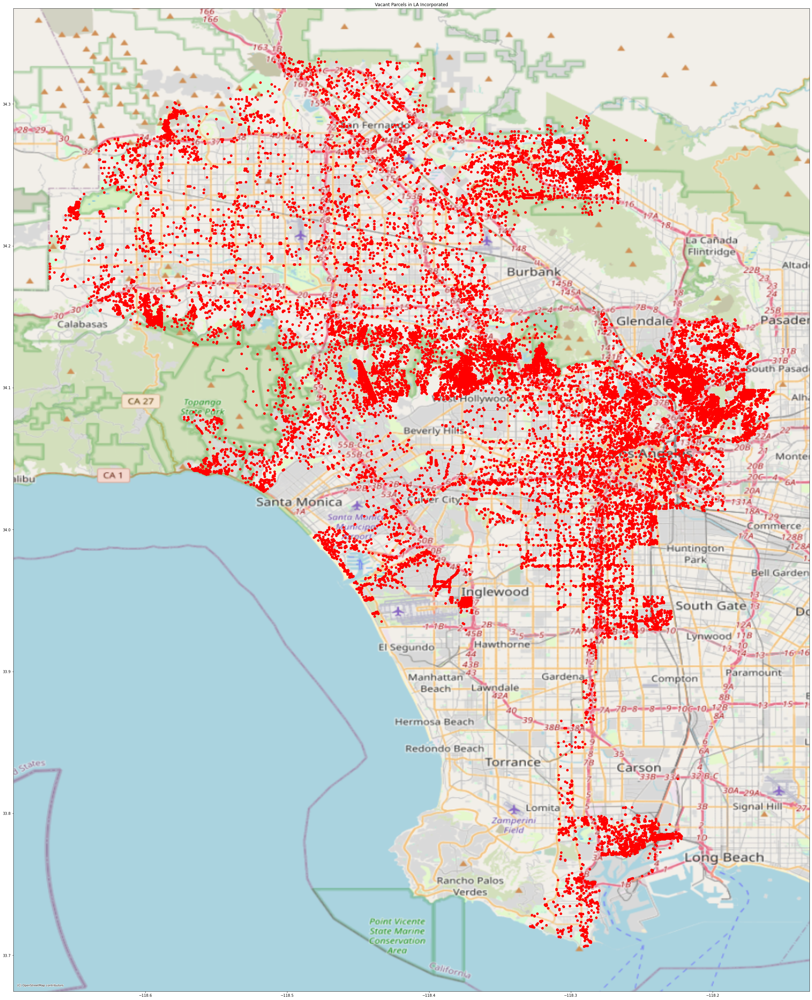

In [7]:
# to map vacant parcels
fig, ax = plt.subplots(figsize=(50,50))

vacgdf.plot(ax=ax,
                      color='red')

# keeping the axis on for now and will turn off later
ax.axis('on')

ax.set_title('Vacant Parcels in LA Incorporated')

# we are interested in seeing LA county map features and will use this basemap
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik, crs=vacgdf.crs)

### Adding Community Boundaries Data Set 

After successfully mapping vacant parcels in LA incorporated, we want to plot it with neighborhood (community) boundaries in LA County

In [8]:
# import the community boundaries dataset by referencing API from data source

import shapely
from shapely.geometry import shape

comdf = pd.read_json( r'https://data.lacounty.gov/resource/frhs-h972.json' )
comdf['the_geom'] = comdf['the_geom'].apply(shape)
comgdf = gpd.GeoDataFrame(comdf).set_geometry('the_geom')

comgdf.sample(5)

,objectid,city_type,lcity,label,source,shape_starea,shape_stlength,the_geom,community
154,186,City,Malibu,City of Malibu,BOS,5.489146e+08,252177.507041,"MULTIPOLYGON (((-118.58442 34.03786, -118.5844...",NaN
210,72,City,Los Angeles,Los Angeles - Crestview,LA City,2.173923e+07,21651.950764,"MULTIPOLYGON (((-118.38367 34.05710, -118.3837...",Crestview
206,233,Unincorporated,Unincorporated,Unincorporated - Bassett,BOS,3.440164e+07,49744.907650,"MULTIPOLYGON (((-117.97040 34.06381, -117.9702...",Bassett
104,301,Unincorporated,Unincorporated,Unincorporated - Rosewood/West Rancho Dominguez,BOS,1.292830e+07,15582.170092,"MULTIPOLYGON (((-118.25999 33.89491, -118.2601...",Rosewood/West Rancho Dominguez
140,117,City,Los Angeles,Los Angeles - Marina Peninsula,LA City,1.072754e+07,23869.855970,"MULTIPOLYGON (((-118.46348 33.98105, -118.4633...",Marina Peninsula


In [9]:
type (comgdf)

geopandas.geodataframe.GeoDataFrame

In [10]:
# first data exploration is to see the overall shape and types of what we called in
comgdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 348 entries, 0 to 347
Data columns (total 9 columns):
 #   Column          Non-Null Count  Dtype   
---  ------          --------------  -----   
 0   objectid        348 non-null    int64   
 1   city_type       348 non-null    object  
 2   lcity           348 non-null    object  
 3   label           348 non-null    object  
 4   source          348 non-null    object  
 5   shape_starea    348 non-null    float64 
 6   shape_stlength  348 non-null    float64 
 7   the_geom        348 non-null    geometry
 8   community       261 non-null    object  
dtypes: float64(2), geometry(1), int64(1), object(5)
memory usage: 24.6+ KB


<AxesSubplot:>

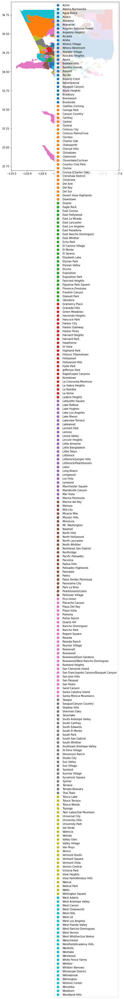

In [11]:
#let's map the community boundaries geodataframe- this will show us the number of communities in LA

comgdf.plot(figsize=(12,12),
                          column='community',
                          legend=True)

### Adding a basemap with vacant lots at large 

In [12]:
comgdf = comgdf.set_crs('epsg:4326')

In [13]:
comgdf.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

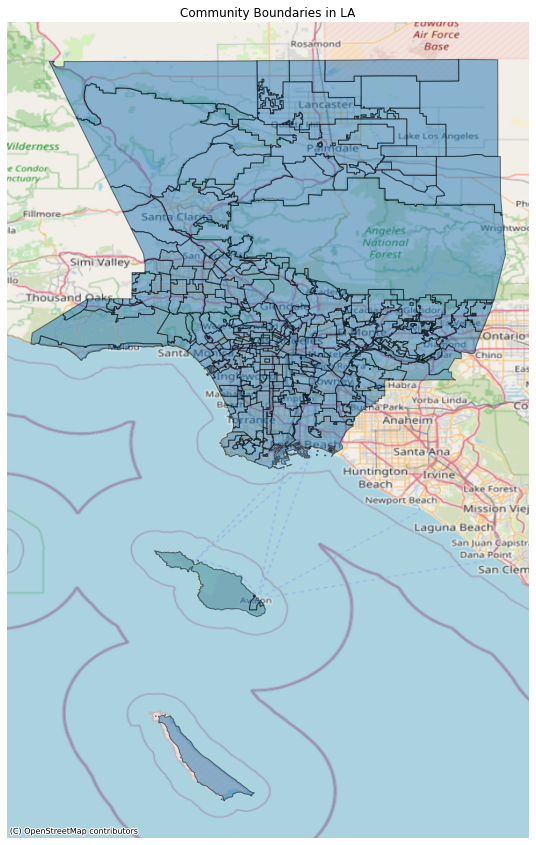

In [14]:
# Great, looks like it's all set, lets see how this plot looks like

ax = comgdf.plot(figsize=(15, 15), alpha=0.5, edgecolor='k')

ax.axis('off')

ax.set_title('Community Boundaries in LA')

ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik, crs=comgdf.crs)

### Spatial Join
we want to assign number of lots per neighborhood

In [15]:
# conduct a spatial join (assign each vacant lot to the neighborhood it is in)
vac_by_com = gpd.sjoin(comgdf, vacgdf) 

#Spatial join Points to polygons
vac_by_com

,objectid,city_type,lcity,label,source,shape_starea,shape_stlength,the_geom,community,index_right,...,location_1,bathrooms,sqftmain,situsdirection,roll_realestateexemp,center_lat,situszip,yearbuilt,propertylocation,situszip5
2,95,City,Los Angeles,Los Angeles - Harvard Heights,LA City,2.089842e+07,21077.385705,"MULTIPOLYGON (((-118.29156 34.04000, -118.2923...",Harvard Heights,14851,...,"{'latitude': '34.04317632', 'needs_recoding': ...",0,0,,0,34.04317632,,0,NaN,NaN
2,95,City,Los Angeles,Los Angeles - Harvard Heights,LA City,2.089842e+07,21077.385705,"MULTIPOLYGON (((-118.29156 34.04000, -118.2923...",Harvard Heights,14814,...,"{'latitude': '34.04326202', 'needs_recoding': ...",0,0,,0,34.04326202,,0,NaN,NaN
2,95,City,Los Angeles,Los Angeles - Harvard Heights,LA City,2.089842e+07,21077.385705,"MULTIPOLYGON (((-118.29156 34.04000, -118.2923...",Harvard Heights,14850,...,"{'latitude': '34.0433412', 'needs_recoding': F...",0,0,,0,34.04334120,,0,NaN,NaN
2,95,City,Los Angeles,Los Angeles - Harvard Heights,LA City,2.089842e+07,21077.385705,"MULTIPOLYGON (((-118.29156 34.04000, -118.2923...",Harvard Heights,490,...,"{'latitude': '34.04679216', 'needs_recoding': ...",0,0,,0,34.04679216,,0,NaN,NaN
2,95,City,Los Angeles,Los Angeles - Harvard Heights,LA City,2.089842e+07,21077.385705,"MULTIPOLYGON (((-118.29156 34.04000, -118.2923...",Harvard Heights,14843,...,"{'latitude': '34.04688601', 'needs_recoding': ...",0,0,,0,34.04688601,90019-4552,0,1512 ARLINGTON AVE LOS ANGELES CA 90019,90019
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
346,174,City,Los Angeles,Los Angeles - West Hills,LA City,2.787144e+08,105989.435412,"MULTIPOLYGON (((-118.60490 34.23545, -118.6045...",West Hills,32038,...,"{'latitude': '34.23666915', 'needs_recoding': ...",0,0,,0,34.23666915,,0,NaN,NaN
346,174,City,Los Angeles,Los Angeles - West Hills,LA City,2.787144e+08,105989.435412,"MULTIPOLYGON (((-118.60490 34.23545, -118.6045...",West Hills,32041,...,"{'latitude': '34.23763845', 'needs_recoding': ...",0,0,,0,34.23763845,,0,NaN,NaN
346,174,City,Los Angeles,Los Angeles - West Hills,LA City,2.787144e+08,105989.435412,"MULTIPOLYGON (((-118.60490 34.23545, -118.6045...",West Hills,32055,...,"{'latitude': '34.23473438', 'needs_recoding': ...",0,0,,0,34.23473438,91304-1436,0,9039 TOPANGA CANYON BLVD LOS ANGELES CA 91304,91304
346,174,City,Los Angeles,Los Angeles - West Hills,LA City,2.787144e+08,105989.435412,"MULTIPOLYGON (((-118.60490 34.23545, -118.6045...",West Hills,32050,...,"{'latitude': '34.23480785', 'needs_recoding': ...",0,0,,0,34.23480785,,0,NaN,NaN


In [16]:
# count how many vacant parcels are in each neighborhood
vac_count = vac_by_com.value_counts('community').reset_index(name='vac_count')
vac_count

,community,vac_count
0,Hollywood Hills,1954
1,Beverly Crest,1818
2,Hollywood,1519
3,Wilmington,1509
4,Mt. Washington,1467
...,...,...
137,Sycamore Square,2
138,Willowbrook,1
139,Universal City,1
140,Toluca Terrace,1


In [19]:
vac_count.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 142 entries, 0 to 141
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   community  142 non-null    object
 1   vac_count  142 non-null    int64 
dtypes: int64(1), object(1)
memory usage: 2.3+ KB


In [20]:
# add the vacant parcel count to the neighborhoods
vac_count2 = comgdf.merge(vac_count, how='left', on='community')
vac_count2.sample(10)

,objectid,city_type,lcity,label,source,shape_starea,shape_stlength,the_geom,community,vac_count
19,81,City,Los Angeles,Los Angeles - Encino,LA City,3.943580e+08,104094.970999,"MULTIPOLYGON (((-118.47402 34.18665, -118.4739...",Encino,309.0
72,103,City,Los Angeles,Los Angeles - Koreatown,LA City,4.064175e+07,28508.355350,"MULTIPOLYGON (((-118.29162 34.05498, -118.2916...",Koreatown,109.0
176,196,City,Pico Rivera,City of Pico Rivera,BOS,2.481807e+08,95367.700976,"MULTIPOLYGON (((-118.04073 34.02534, -118.0442...",NaN,NaN
178,309,Unincorporated,Unincorporated,Unincorporated - Santa Monica Mountains,BOS,3.168148e+09,479104.257210,"MULTIPOLYGON (((-118.60582 34.14579, -118.5924...",Santa Monica Mountains,NaN
158,120,City,Los Angeles,Los Angeles - Miracle Mile,LA City,3.325829e+07,40344.752382,"MULTIPOLYGON (((-118.34402 34.06889, -118.3440...",Miracle Mile,25.0
83,198,City,Redondo Beach,City of Redondo Beach,BOS,1.737514e+08,116820.913224,"MULTIPOLYGON (((-118.36584 33.89462, -118.3612...",NaN,NaN
11,86,City,Los Angeles,Los Angeles - Florence-Firestone,LA City,7.053592e+07,41435.669231,"MULTIPOLYGON (((-118.25631 33.98948, -118.2563...",Florence-Firestone,183.0
341,150,City,Los Angeles,Los Angeles - Sunland,LA City,1.842077e+08,108169.637522,"MULTIPOLYGON (((-118.29697 34.27881, -118.2970...",Sunland,492.0
181,123,City,Los Angeles,Los Angeles - North Hills,LA City,1.459085e+08,57611.642939,"MULTIPOLYGON (((-118.47212 34.25732, -118.4721...",North Hills,101.0
207,116,City,Los Angeles,Los Angeles - Mar Vista,LA City,9.806254e+07,51028.698407,"MULTIPOLYGON (((-118.42992 34.02686, -118.4301...",Mar Vista,101.0


<AxesSubplot:>

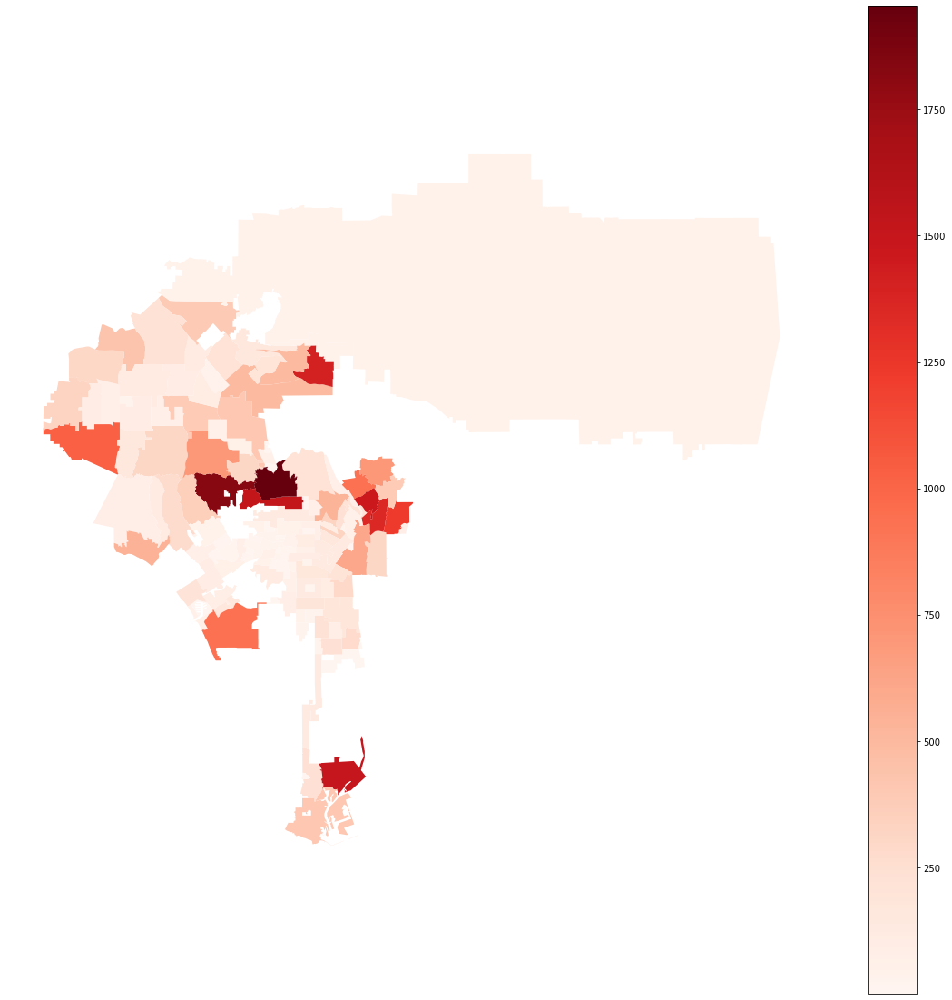

In [21]:
# choropleth map of vacant lots by community boundary
fig,ax = plt.subplots(figsize=(20,20))

ax.axis('off')

vac_count2.plot(ax=ax,column='vac_count',legend=True,cmap='Reds')

This chloropleth map shows us which LA incorporated neighborhoods have more or less lots. Note that the highest density area is in the center around Elysian Park and the Chinatown, Downtown area.

In [25]:
vac_count2.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [23]:
# for interactive plots
import plotly.express as px

import folium

In [45]:
vacneighb = gpd.sjoin(vacgdf, comgdf, how="inner", op="within")

In [53]:
vacneighb.head()

,usecodedescchar1,roll_homeownersexemp,situsunit,recordingdate,effectiveyearbuilt,istaxableparcel,roll_totlandimp,roll_perspropexemp,parcelboundarydescription,roll_landbaseyear,...,geometry,index_right,objectid,city_type,lcity,label,source,shape_starea,shape_stlength,community
0,Industrial,0,,20140123,0,Y,42410,0,OWENSMOUTH S 50 FT OF N 100 FT OF W 231.43 FT ...,1975,...,POINT (-118.59799 34.19628),85,61,City,Los Angeles,Los Angeles - Canoga Park,LA City,1.282930e+08,57957.649654,Canoga Park
692,Commercial,0,,19880725,0,Y,266774,0,OWENSMOUTH LOT 12 BLK 79,1986,...,POINT (-118.60194 34.19795),85,61,City,Los Angeles,Los Angeles - Canoga Park,LA City,1.282930e+08,57957.649654,Canoga Park
694,Industrial,0,,19920323,0,Y,74924,0,OWENSMOUTH LOT 18 BLK 83,1992,...,POINT (-118.59630 34.19792),85,61,City,Los Angeles,Los Angeles - Canoga Park,LA City,1.282930e+08,57957.649654,Canoga Park
695,Residential,0,,19981211,0,Y,32418,0,OWENSMOUTH N 100 FT OF W 110 FT OF LOT 1 BL...,1975,...,POINT (-118.60124 34.19716),85,61,City,Los Angeles,Los Angeles - Canoga Park,LA City,1.282930e+08,57957.649654,Canoga Park
697,Residential,0,,20050708,0,Y,477566,0,OWENSMOUTH S 50 FT OF E 160 FT OF LOT 2 BLK...,2006,...,POINT (-118.60195 34.19654),85,61,City,Los Angeles,Los Angeles - Canoga Park,LA City,1.282930e+08,57957.649654,Canoga Park


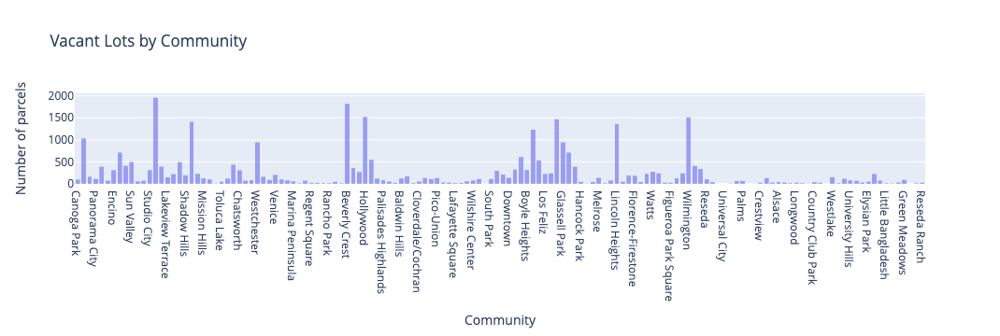

In [46]:
# add labels by providing a dict
fig = px.bar(
        vacneighb,
       x='community',
       title='Vacant Lots by Community',
        labels={
            'community':'Community',
            'count':'Number of parcels'
        }
)

# get rid of white lines inside the bars
fig.update_traces(marker_line_width=0)

# show the figure
fig.show()

In [47]:
vacneighb.community.unique().tolist()

['Canoga Park',
 'Woodland Hills',
 'Tarzana',
 'Panorama City',
 'Van Nuys',
 'Lake Balboa',
 'Encino',
 'Sherman Oaks',
 'North Hollywood',
 'Sun Valley',
 'Valley Glen',
 'Valley Village',
 'Studio City',
 'Hollywood Hills',
 'Sylmar',
 'Lakeview Terrace',
 'Pacoima',
 'Sunland',
 'Shadow Hills',
 'Tujunga',
 'Granada Hills',
 'Mission Hills',
 'North Hills',
 'Toluca Woods',
 'Toluca Lake',
 'Northridge',
 'Porter Ranch',
 'Chatsworth',
 'Winnetka',
 'Hyde Park',
 'Westchester',
 'Playa Vista',
 'Del Rey',
 'Venice',
 'Mar Vista',
 'West Los Angeles',
 'Marina Peninsula',
 'Reynier Village',
 'Beverlywood',
 'Regent Square',
 'Cheviot Hills',
 'Century City',
 'Rancho Park',
 'Westwood',
 'South Carthay',
 'Beverly Crest',
 'Bel Air',
 'Brentwood',
 'Hollywood',
 'Pacific Palisades',
 'Mandeville Canyon',
 'Palisades Highlands',
 'Leimert Park',
 'Vermont Square',
 'Baldwin Hills',
 'Exposition Park',
 'Crenshaw District',
 'Cloverdale/Cochran',
 'University Park',
 'West Adams',
 

In [48]:
# show me distinct value of vacant parcels for each neighborhood
vaccount = vacneighb.value_counts('community').reset_index(name='count')
vaccount

,community,count
0,Hollywood Hills,1954
1,Beverly Crest,1818
2,Hollywood,1519
3,Wilmington,1509
4,Mt. Washington,1467
...,...,...
137,Sycamore Square,2
138,Willowbrook,1
139,Universal City,1
140,Toluca Terrace,1


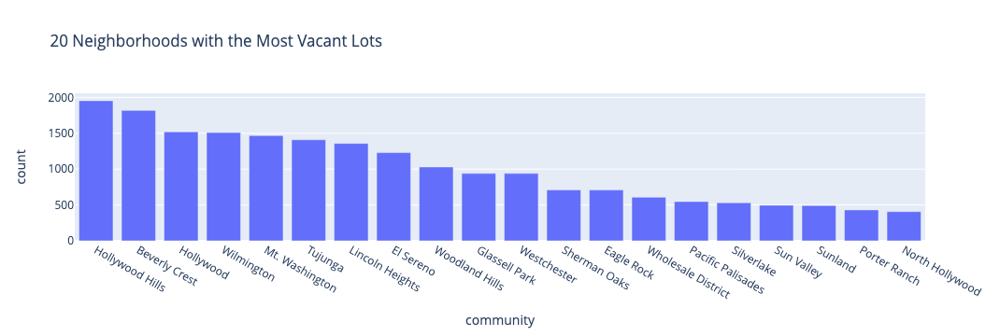

In [49]:
# plot the neighborhoods with the most vacant lots
fig = px.bar(vaccount.head(20),
       x='community',
       y='count',
       title='20 Neighborhoods with the Most Vacant Lots')

fig.show()

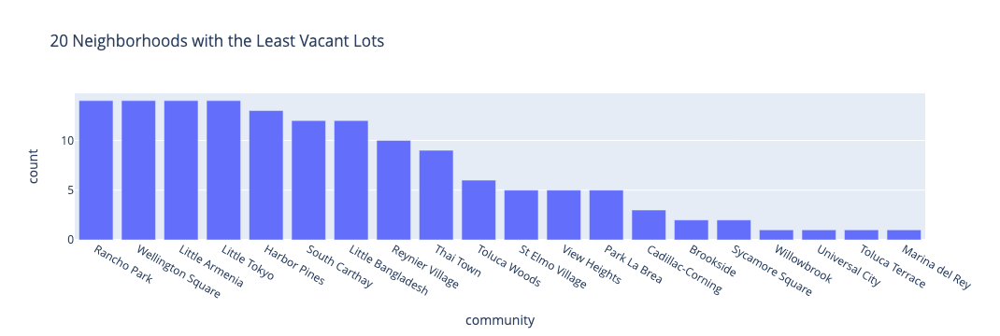

In [50]:
# plot the neighborhoods with the most vacant lots
fig = px.bar(vaccount.tail(20),
       x='community',
       y='count',
       title='20 Neighborhoods with the Least Vacant Lots')

fig.show()

In [62]:
vac_grouped = vacneighb.value_counts(['community','usecodedescchar1']).reset_index(name='count')
vac_grouped

,community,usecodedescchar1,count
0,Hollywood Hills,Residential,1925
1,Beverly Crest,Residential,1815
2,Mt. Washington,Residential,1449
3,Hollywood,Residential,1444
4,Tujunga,Residential,1351
...,...,...,...
490,Lincoln Heights,Institutional,1
491,Universal City,Residential,1
492,Manchester Square,Miscellaneous,1
493,Tujunga,Industrial,1


In [63]:
# make a stacked bar chart
fig = px.bar(vac_grouped,
       x='community',
       y='count',
       color='usecodedescchar1' # this creates the "stack"
)

fig.show()

ValueError: Value of 'y' is not the name of a column in 'data_frame'. Expected one of ['usecodedescchar1', 'roll_homeownersexemp', 'situsunit', 'recordingdate', 'effectiveyearbuilt', 'istaxableparcel', 'roll_totlandimp', 'roll_perspropexemp', 'parcelboundarydescription', 'roll_landbaseyear', 'situscity', 'roll_impbaseyear', 'usetype', 'cluster', 'adminregion', 'usecodedescchar3', 'roll_fixtureexemp', 'nettaxablevalue', 'taxratearea', 'rowid', 'roll_landvalue', 'units', 'taxratearea_city', 'situsfraction', 'roll_impvalue', 'usecode', 'situsstreet', 'parcelclassification', 'assessorid', 'roll_perspropvalue', 'bedrooms', 'usecodedescchar2', 'roll_totalvalue', 'rollyear', 'ain', 'situshouseno', 'roll_fixturevalue', 'usecodedescchar4', 'center_lon', 'roll_totalexemption', 'totbuildingdatalines', 'location_1', 'bathrooms', 'sqftmain', 'situsdirection', 'roll_realestateexemp', 'center_lat', 'situszip', 'yearbuilt', 'propertylocation', 'situszip5', 'geometry', 'index_right', 'objectid', 'city_type', 'lcity', 'label', 'source', 'shape_starea', 'shape_stlength', 'community'] but received: count

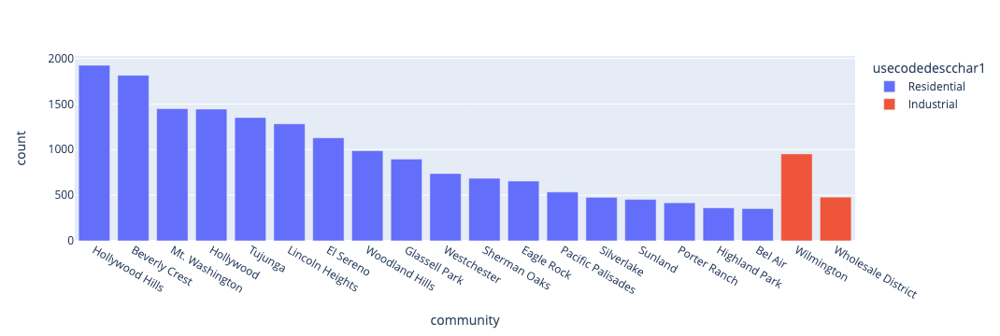

In [61]:
# make a stacked bar chart
fig = px.bar(vac_grouped.head(20),
       x='community',
       y='count',
       color='usecodedescchar1' # this creates the "stack"
)

fig.show()

In [88]:
vacneighb.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 33066 entries, 0 to 32948
Data columns (total 61 columns):
 #   Column                     Non-Null Count  Dtype   
---  ------                     --------------  -----   
 0   usecodedescchar1           33055 non-null  object  
 1   roll_homeownersexemp       33066 non-null  object  
 2   situsunit                  33066 non-null  object  
 3   recordingdate              33066 non-null  object  
 4   effectiveyearbuilt         33066 non-null  object  
 5   istaxableparcel            33066 non-null  object  
 6   roll_totlandimp            33066 non-null  object  
 7   roll_perspropexemp         33066 non-null  object  
 8   parcelboundarydescription  33066 non-null  object  
 9   roll_landbaseyear          33066 non-null  object  
 10  situscity                  33066 non-null  object  
 11  roll_impbaseyear           33066 non-null  object  
 12  usetype                    33055 non-null  object  
 13  cluster                

In [86]:
vacneighb.fillna({'usecodedescchar1':'N/A'})

,usecodedescchar1,roll_homeownersexemp,situsunit,recordingdate,effectiveyearbuilt,istaxableparcel,roll_totlandimp,roll_perspropexemp,parcelboundarydescription,roll_landbaseyear,...,geometry,index_right,objectid,city_type,lcity,label,source,shape_starea,shape_stlength,community
0,Industrial,0,,20140123,0,Y,42410,0,OWENSMOUTH S 50 FT OF N 100 FT OF W 231.43 FT ...,1975,...,POINT (-118.59799 34.19628),85,61,City,Los Angeles,Los Angeles - Canoga Park,LA City,1.282930e+08,57957.649654,Canoga Park
692,Commercial,0,,19880725,0,Y,266774,0,OWENSMOUTH LOT 12 BLK 79,1986,...,POINT (-118.60194 34.19795),85,61,City,Los Angeles,Los Angeles - Canoga Park,LA City,1.282930e+08,57957.649654,Canoga Park
694,Industrial,0,,19920323,0,Y,74924,0,OWENSMOUTH LOT 18 BLK 83,1992,...,POINT (-118.59630 34.19792),85,61,City,Los Angeles,Los Angeles - Canoga Park,LA City,1.282930e+08,57957.649654,Canoga Park
695,Residential,0,,19981211,0,Y,32418,0,OWENSMOUTH N 100 FT OF W 110 FT OF LOT 1 BL...,1975,...,POINT (-118.60124 34.19716),85,61,City,Los Angeles,Los Angeles - Canoga Park,LA City,1.282930e+08,57957.649654,Canoga Park
697,Residential,0,,20050708,0,Y,477566,0,OWENSMOUTH S 50 FT OF E 160 FT OF LOT 2 BLK...,2006,...,POINT (-118.60195 34.19654),85,61,City,Los Angeles,Los Angeles - Canoga Park,LA City,1.282930e+08,57957.649654,Canoga Park
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32941,Residential,0,,20051101,0,Y,662453,0,TRACT NO 11756 (EX OF ST) LOT 46,2006,...,POINT (-118.55186 34.20891),139,139,City,Los Angeles,Los Angeles - Reseda Ranch,LA City,2.005916e+07,19423.146096,Reseda Ranch
32945,Residential,0,,20120531,0,Y,209020,0,TRACT NO 1875 LOT (EX OF ST) COM N ON E LINE...,2012,...,POINT (-118.55417 34.21806),139,139,City,Los Angeles,Los Angeles - Reseda Ranch,LA City,2.005916e+07,19423.146096,Reseda Ranch
32946,Residential,0,,20060831,0,Y,445906,0,TR=1875 POR OF LOT 1,2007,...,POINT (-118.55414 34.21871),139,139,City,Los Angeles,Los Angeles - Reseda Ranch,LA City,2.005916e+07,19423.146096,Reseda Ranch
32947,Residential,0,,20120531,0,Y,209020,0,TRACT NO 1875 LOT COM N ON E LINE OF LOT 119...,2012,...,POINT (-118.55417 34.21785),139,139,City,Los Angeles,Los Angeles - Reseda Ranch,LA City,2.005916e+07,19423.146096,Reseda Ranch


In [87]:
vacneighb.fillna({'community':'N/A'})

,usecodedescchar1,roll_homeownersexemp,situsunit,recordingdate,effectiveyearbuilt,istaxableparcel,roll_totlandimp,roll_perspropexemp,parcelboundarydescription,roll_landbaseyear,...,geometry,index_right,objectid,city_type,lcity,label,source,shape_starea,shape_stlength,community
0,Industrial,0,,20140123,0,Y,42410,0,OWENSMOUTH S 50 FT OF N 100 FT OF W 231.43 FT ...,1975,...,POINT (-118.59799 34.19628),85,61,City,Los Angeles,Los Angeles - Canoga Park,LA City,1.282930e+08,57957.649654,Canoga Park
692,Commercial,0,,19880725,0,Y,266774,0,OWENSMOUTH LOT 12 BLK 79,1986,...,POINT (-118.60194 34.19795),85,61,City,Los Angeles,Los Angeles - Canoga Park,LA City,1.282930e+08,57957.649654,Canoga Park
694,Industrial,0,,19920323,0,Y,74924,0,OWENSMOUTH LOT 18 BLK 83,1992,...,POINT (-118.59630 34.19792),85,61,City,Los Angeles,Los Angeles - Canoga Park,LA City,1.282930e+08,57957.649654,Canoga Park
695,Residential,0,,19981211,0,Y,32418,0,OWENSMOUTH N 100 FT OF W 110 FT OF LOT 1 BL...,1975,...,POINT (-118.60124 34.19716),85,61,City,Los Angeles,Los Angeles - Canoga Park,LA City,1.282930e+08,57957.649654,Canoga Park
697,Residential,0,,20050708,0,Y,477566,0,OWENSMOUTH S 50 FT OF E 160 FT OF LOT 2 BLK...,2006,...,POINT (-118.60195 34.19654),85,61,City,Los Angeles,Los Angeles - Canoga Park,LA City,1.282930e+08,57957.649654,Canoga Park
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32941,Residential,0,,20051101,0,Y,662453,0,TRACT NO 11756 (EX OF ST) LOT 46,2006,...,POINT (-118.55186 34.20891),139,139,City,Los Angeles,Los Angeles - Reseda Ranch,LA City,2.005916e+07,19423.146096,Reseda Ranch
32945,Residential,0,,20120531,0,Y,209020,0,TRACT NO 1875 LOT (EX OF ST) COM N ON E LINE...,2012,...,POINT (-118.55417 34.21806),139,139,City,Los Angeles,Los Angeles - Reseda Ranch,LA City,2.005916e+07,19423.146096,Reseda Ranch
32946,Residential,0,,20060831,0,Y,445906,0,TR=1875 POR OF LOT 1,2007,...,POINT (-118.55414 34.21871),139,139,City,Los Angeles,Los Angeles - Reseda Ranch,LA City,2.005916e+07,19423.146096,Reseda Ranch
32947,Residential,0,,20120531,0,Y,209020,0,TRACT NO 1875 LOT COM N ON E LINE OF LOT 119...,2012,...,POINT (-118.55417 34.21785),139,139,City,Los Angeles,Los Angeles - Reseda Ranch,LA City,2.005916e+07,19423.146096,Reseda Ranch


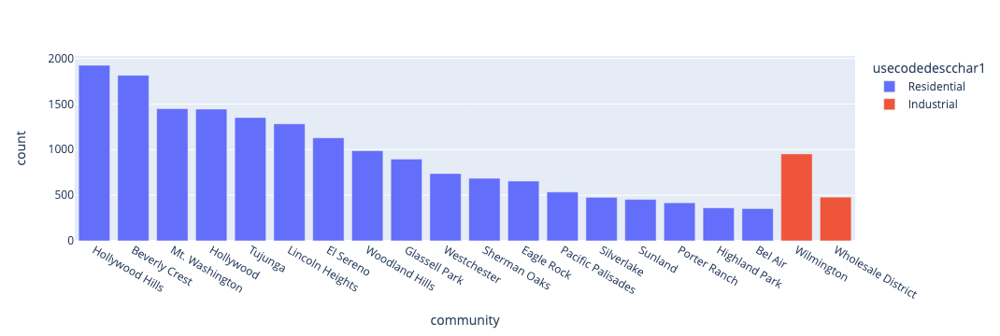

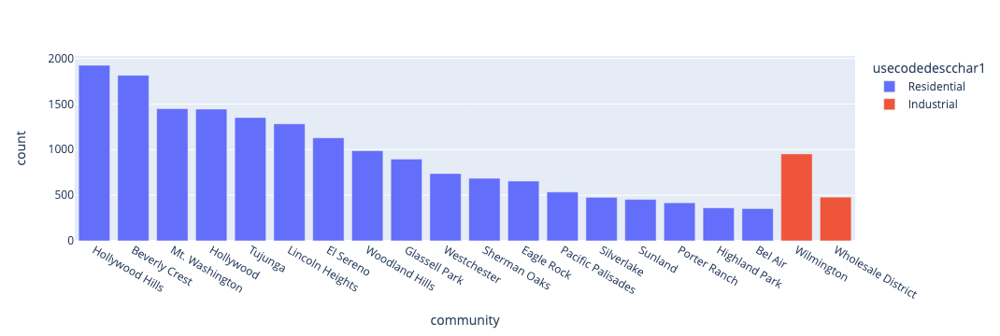

<Figure size 432x288 with 0 Axes>

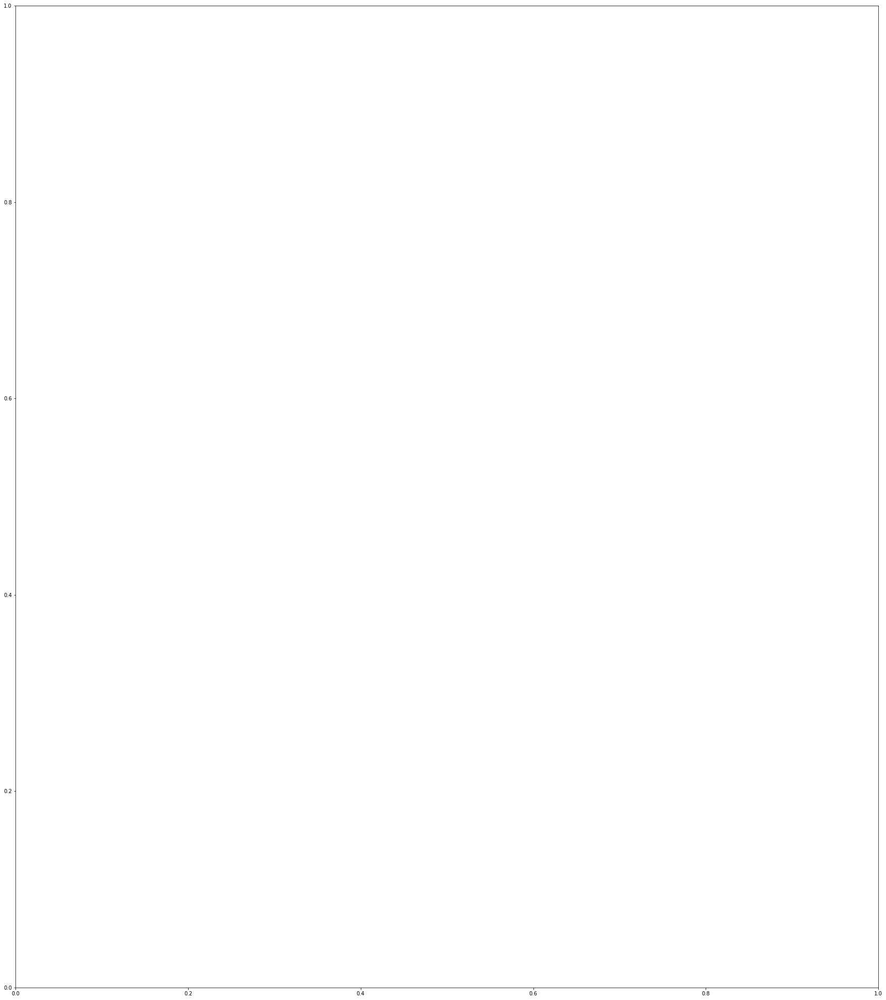

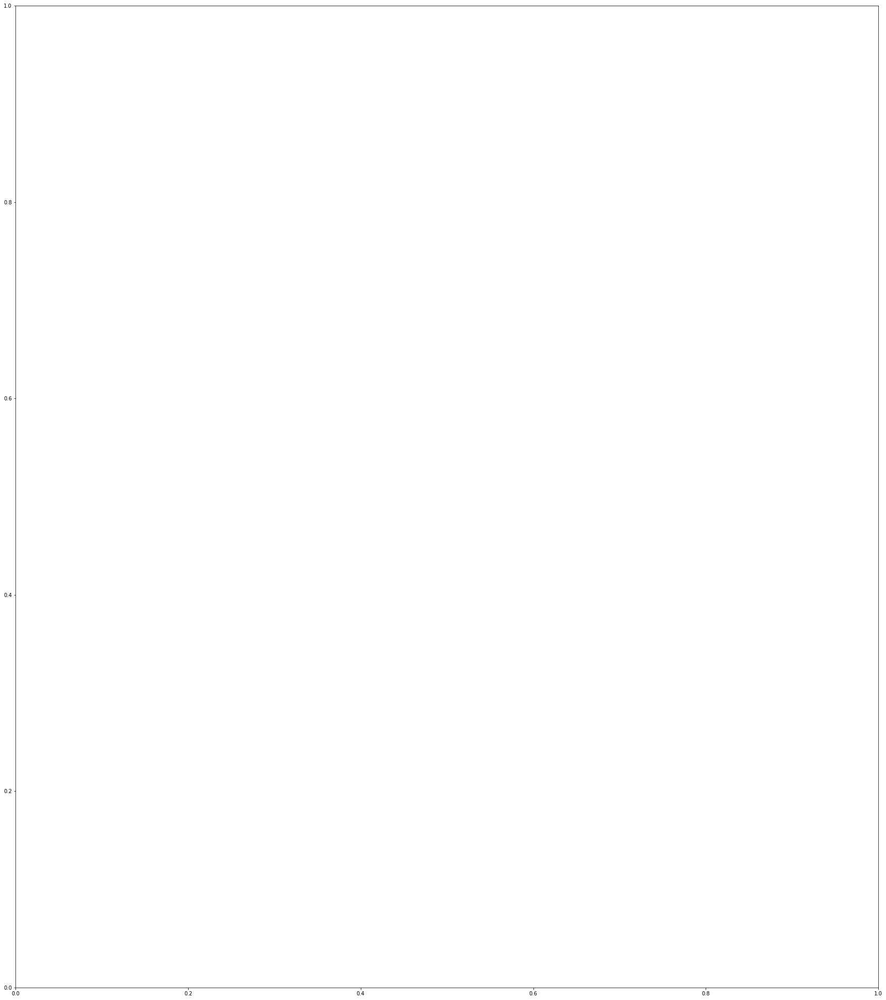

In [ ]:
# interactive map
fig = px.scatter_mapbox(vacneighb, 
                        color="usecodedescchar1",
                        labels={'usecodedescchar1':'community'},
                        mapbox_style="carto-positron"
                       )

# options on the layout
fig.update_layout(
    width = 800,
    height = 800,
    title = "Interactive Vacant Lots",
    title_x=0.5 # aligns title to center
)


fig.show()